In [1]:
# import dependencies
import pandas as pd
import sqlite3
from datetime import datetime, timedelta

In [2]:
# Create your connections with indoor and outdoor databases
Ocnx = sqlite3.connect('Outdoor.db')
Icnx = sqlite3.connect('Indoor.db')
Outdoor_df = pd.read_sql_query("SELECT * FROM BME_DATA", Ocnx)
Indoor_df = pd.read_sql_query("SELECT * FROM BME_DATA", Icnx)

In [3]:
# Convert time into datetime
Outdoor_df['TIME_STAMP'] = pd.to_datetime(Outdoor_df['TIME_STAMP'])
Indoor_df['TIME_STAMP'] = pd.to_datetime(Indoor_df['TIME_STAMP'])

In [4]:
Outdoor_df['TIME_STAMP'] = Outdoor_df['TIME_STAMP'].dt.round('1min')
Indoor_df['TIME_STAMP'] = Indoor_df['TIME_STAMP'].dt.round('1min')

In [5]:
# Deleting the wrong input at the first rows
Outdoor_df = Outdoor_df.iloc[1:]
Indoor_df = Indoor_df.iloc[1:]

In [6]:
# converting temperature from C to f
Outdoor_df['TEMPERATURE'] = round((Outdoor_df['TEMPERATURE']* 9/5) + 32)
Indoor_df['TEMPERATURE'] = round((Indoor_df['TEMPERATURE']* 9/5) + 32)

In [7]:
# Merging Indor and Outdoor (on time stamp)
master_df = pd.merge(Outdoor_df, Indoor_df, on = "TIME_STAMP", how = "left", suffixes=("_Out","_In"))
master_df.head()

,id_Out,TIME_STAMP,TEMPERATURE_Out,GAS_Out,HUMIDITY_Out,PRESSURE_Out,ALTITUDE_Out,id_In,TEMPERATURE_In,GAS_In,HUMIDITY_In,PRESSURE_In,ALTITUDE_In
0,2,2019-05-12 18:58:00,75.0,364884,84.9,975.0,323.2,2.0,74.0,6049661.0,35.9,972.9,341.2
1,3,2019-05-12 18:59:00,75.0,362475,84.6,975.0,323.3,3.0,74.0,5851528.0,35.9,972.9,341.3
2,4,2019-05-12 19:00:00,75.0,362874,84.2,975.0,323.4,4.0,74.0,5636172.0,36.2,972.9,341.4
3,5,2019-05-12 19:01:00,75.0,362475,84.4,975.0,323.5,5.0,74.0,5441624.0,37.3,972.9,341.5
4,6,2019-05-12 19:02:00,75.0,362874,84.4,975.0,323.5,6.0,74.0,5219085.0,37.1,972.9,341.6


In [8]:
# Convert datetime into float
#master_df['TIME_STAMP'] = pd.to_numeric(master_df['TIME_STAMP'], downcast = 'float')

In [9]:
master_df= master_df.dropna()
master_df.head()

,id_Out,TIME_STAMP,TEMPERATURE_Out,GAS_Out,HUMIDITY_Out,PRESSURE_Out,ALTITUDE_Out,id_In,TEMPERATURE_In,GAS_In,HUMIDITY_In,PRESSURE_In,ALTITUDE_In
0,2,2019-05-12 18:58:00,75.0,364884,84.9,975.0,323.2,2.0,74.0,6049661.0,35.9,972.9,341.2
1,3,2019-05-12 18:59:00,75.0,362475,84.6,975.0,323.3,3.0,74.0,5851528.0,35.9,972.9,341.3
2,4,2019-05-12 19:00:00,75.0,362874,84.2,975.0,323.4,4.0,74.0,5636172.0,36.2,972.9,341.4
3,5,2019-05-12 19:01:00,75.0,362475,84.4,975.0,323.5,5.0,74.0,5441624.0,37.3,972.9,341.5
4,6,2019-05-12 19:02:00,75.0,362874,84.4,975.0,323.5,6.0,74.0,5219085.0,37.1,972.9,341.6


In [10]:
# Python
import pandas as pd
from fbprophet import Prophet

In [11]:
outdoor = master_df.loc[:,["TIME_STAMP", "TEMPERATURE_Out"]]
outdoor.columns = ['ds', 'y']
outdoor.head()

,ds,y
0,2019-05-12 18:58:00,75.0
1,2019-05-12 18:59:00,75.0
2,2019-05-12 19:00:00,75.0
3,2019-05-12 19:01:00,75.0
4,2019-05-12 19:02:00,75.0


In [ ]:
# Python
od = Prophet()
od.fit(outdoor)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.


In [ ]:
#forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
future = od.make_future_dataframe(periods= 1)
forecast = od.predict(future)
forecast.head()

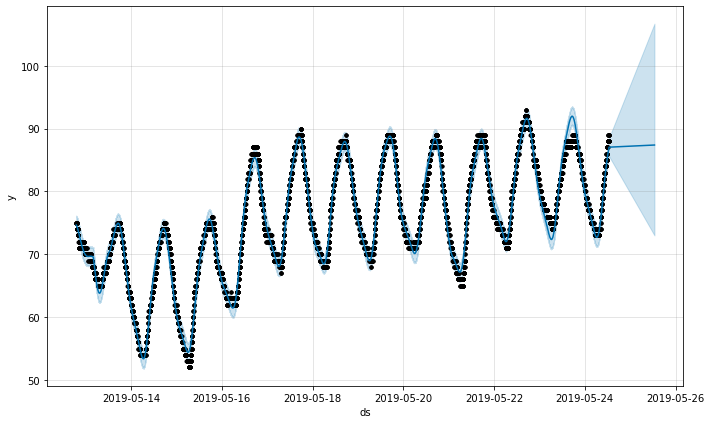

In [15]:
od_plot = od.plot(forecast)

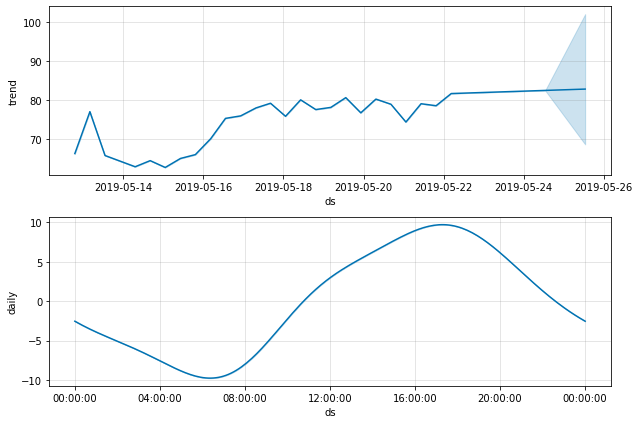

In [16]:
fig2 = od.plot_components(forecast)

In [17]:
# Python
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(od, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [18]:
import plotly.offline as py
import plotly.graph_objs as go

In [20]:

py.iplot([
    go.Scatter(x=outdoor['ds'], y=outdoor['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [22]:
periods_to_fcast = 1
m = Prophet()
m.fit(outdoor);

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
C:\Anaconda3\envs\pr3\lib\site-packages\pystan\misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

